In [149]:
import os, glob
import numpy as np
import xarray as xr
from enum import Enum
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from glob import glob
import sys
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
sys.path.append('modules')
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import constants
sys.path.append(constants.MODULE_DIR)
import open_ds
import xarray_class_accessors as xca
from importlib import reload
import sn_plotting
import utils

In [82]:
constants.LONGRUNMIP_CONSECMET_DIR

'/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics'

In [425]:
class LocationsLatLon(Enum):
    '''Latittude and longitude of different locations around the world'''
    EPACIFIC = (2.7 ,-85)
    NATLANTIC = (2.2, -8)
    ECHINA_SEA = (26, 128)
    MELBOURNE = (-38, 145)
    LONDON = (51, 0.12)
    NEW_YORK = (40.7, 74)
    BEIJING = (40, 116) 
    BUENOS_AIRES = (35, 58)
    KINSHASA = (4.4, 15.2)
    ARCTIC = (76, 100)
    JAKARTA = (-6.2088, 106.84)

# Opening Files

## tas

In [84]:
FILE_NAME_DICT = open_ds.get_exeriment_file_names()

ECHAM5MPIOM, ECEARTH, HadGEM2, MIROC32, GFDLCM3, GFDLESM2M, 
- Fraction of good models 1.0
------
HadGEM2, GFDLCM3, ECHAM5MPIOM, GFDLESM2M, GFDLESM2M, ECEARTH, GFDLCM3, MIROC32, 
- Fraction of good models 1.0
------
ECHAM5MPIOM, GFDLESM2M, MIROC32, GFDLCM3, HadGEM2, ECEARTH, 
- Fraction of good models 1.0
------
GFDLESM2M, ECEARTH, GFDLCM3, MIROC32, HadGEM2, ECHAM5MPIOM, 
- Fraction of good models 1.0
------


In [85]:
FILE_NAME_DICT.keys()

dict_keys(['abrupt4x_raw', 'control_raw', 'abrupt4x_loess', 'control_loess'])

In [86]:
abrupt4x_ds = open_ds.read_and_merge_netcdfs(fnames = FILE_NAME_DICT['abrupt4x_raw']['file_names'],
                                             ROOT_DIR = FILE_NAME_DICT['abrupt4x_raw']['base_path'])

tas_mon_GISSE2R_abrupt4x_5001_g025.nc
tas_mon_MPIESM12_abrupt4x_999_g025.nc
tas_mon_CNRMCM61_abrupt4x_1850_g025.nc
 - Dropping coords ['height']
tas_mon_CCSM3_abrupt4x_2120_g025.nc
tas_ann_MPIESM11_abrupt4x_4459_g025.nc
tas_mon_CESM104_abrupt4x_5900_g025.nc
tas_ann_FAMOUS_abrupt4x_3000_g025.nc
 - Dropping coords ['height']
tas_mon_HadCM3L_abrupt4x_1000_g025.nc
tas_mon_IPSLCM5A_abrupt4x_1000_g025.nc
 - Dropping coords ['height']


In [87]:
abrupt4x_ds

<xarray.Dataset>
Dimensions:   (time: 5900, lat: 72, lon: 144)
Coordinates:
  * time      (time) object 0000-12-31 00:00:00 ... 5899-12-31 00:00:00
  * lat       (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * lon       (lon) float64 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    gisse2r   (time, lat, lon) float32 226.4 226.3 226.3 226.1 ... nan nan nan
    mpiesm12  (time, lat, lon) float32 224.6 224.5 224.5 224.5 ... nan nan nan
    cnrmcm61  (time, lat, lon) float32 225.8 225.8 225.8 225.9 ... nan nan nan
    ccsm3     (time, lat, lon) float32 236.7 236.3 236.3 236.0 ... nan nan nan
    mpiesm11  (time, lat, lon) float32 225.2 225.2 225.3 225.3 ... nan nan nan
    cesm104   (time, lat, lon) float32 ...
    famous    (time, lat, lon) float32 226.6 226.6 226.5 226.4 ... nan nan nan
    hadcm3l   (time, lat, lon) float64 229.2 229.1 229.2 229.2 ... nan nan nan
    ipslcm5a  (time, lat, lon) float32 230.3 230.1 230.0 229.9 ... nan nan nan
Attributes:
    length:   5001

In [88]:
control_ds = open_ds.read_and_merge_netcdfs(fnames = FILE_NAME_DICT['control_raw']['file_names'],
                                             ROOT_DIR = FILE_NAME_DICT['control_raw']['base_path'])

tas_mon_HadCM3L_control_1000_g025.nc
tas_mon_CCSM3_control_1530_g025.nc
tas_mon_GISSE2R_control_5225_g025.nc
tas_ann_MPIESM11_control_2000_g025.nc
tas_mon_IPSLCM5A_control_1000_g025.nc
 - Dropping coords ['height']
tas_mon_MPIESM12_control_1237_g025.nc
tas_ann_FAMOUS_control_3000_g025.nc
 - Dropping coords ['height']
tas_mon_CESM104_control_1000_g025.nc
tas_mon_CNRMCM61_control_2000_g025.nc
 - Dropping coords ['height']


In [89]:
abrupt4x_anom_ds = abrupt4x_ds.clima_ds.anomalies(control_ds)
abrupt4x_anom_ds

gisse2r, Using historical dataset
mpiesm12, Using historical dataset
cnrmcm61, Using historical dataset
ccsm3, Using historical dataset
mpiesm11, Using historical dataset
cesm104, Using historical dataset
famous, Using historical dataset
hadcm3l, Using historical dataset
ipslcm5a, Using historical dataset


<xarray.Dataset>
Dimensions:   (time: 5900, lat: 72, lon: 144)
Coordinates:
  * time      (time) object 0000-12-31 00:00:00 ... 5899-12-31 00:00:00
  * lat       (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * lon       (lon) float64 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    gisse2r   (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    mpiesm12  (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    cnrmcm61  (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    ccsm3     (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    mpiesm11  (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    cesm104   (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    famous    (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    hadcm3l   (time, lat, lon) float64 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>
    ipslcm5a  (time, lat, lon) float32 dask.array<chunksize=(8, 72, 144), meta=np.ndarray>

In [90]:
#  !!!!! Dont need global mean

# abrupt4x_smean_ds = abrupt4x_ds.clima_ds.space_mean()
# control_smean_ds = control_ds.clima_ds.space_mean()
# abrupt4x_anom_smean_ds = abrupt4x_smean_ds.clima_ds.anomalies(control_smean_ds)
# fig = plt.figure(figsize=(12,8))
# abrupt4x_anom_smean_ds['ccsm3'].isel(time=slice(0,500)).plot()

## Signal to Noise

In [91]:
os.listdir(constants.LONGRUNMIP_CONSECMET_DIR)

['window_101_length_500', '51', 'window_51_length_500']

In [92]:
window = 'window_51_length_500'
window

'window_51_length_500'

In [93]:
ROOT_DIR = os.path.join(constants.LONGRUNMIP_CONSECMET_DIR, window)
ROOT_DIR

'/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500'

In [94]:
consec_nc_files =  glob(os.path.join(ROOT_DIR, 'consec_mets_*.nc'))
consec_nc_files

['/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_MPIESM12.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_IPSLCM5A.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_HadCM3L.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_FAMOUS.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_CNRMCM61.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_CESM104.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_GISSE2R.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_MPIESM11.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_CCSM3.nc']

In [95]:
nc_files_stable = glob(os.path.join(ROOT_DIR, '*sn_stable*.nc'))
nc_files_sn = glob(os.path.join(ROOT_DIR, '*sn_[!stable]*.nc'))
nc_files_sn

['/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_CNRMCM61.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_CESM104.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_MPIESM12.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_FAMOUS.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_IPSLCM5A.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_GISSE2R.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_MPIESM11.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_HadCM3L.nc',
 '/g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_CCSM3.nc']

In [96]:
consec_ds = open_ds.open_and_concat_nc_files(consec_nc_files)

Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_MPIESM12.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_IPSLCM5A.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_HadCM3L.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_FAMOUS.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_CNRMCM61.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_CESM104.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_GISSE2R.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/consec_mets_MPIESM11.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/

In [97]:
stable_ds = open_ds.open_and_concat_nc_files(nc_files_stable)

Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_IPSLCM5A.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_CNRMCM61.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_HadCM3L.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_MPIESM12.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_GISSE2R.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_CCSM3.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_FAMOUS.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_stable_MPIESM11.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_me

In [98]:
sn_ds = open_ds.open_and_concat_nc_files(nc_files_sn)

Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_CNRMCM61.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_CESM104.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_MPIESM12.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_FAMOUS.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_IPSLCM5A.nc
Removing coords - ['height']
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_GISSE2R.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_MPIESM11.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_HadCM3L.nc
Opening /g/data/w40/ab2313/PhD/longrunmip/consecutive_metrics/window_51_length_500/da_sn_CCSM3.nc
Merging toge

In [99]:
sn_ds

<xarray.Dataset>
Dimensions:          (time: 501, lon: 144, lat: 72, model: 9)
Coordinates:
  * time             (time) object 0000-12-31 00:00:00 ... 0500-12-31 00:00:00
  * lon              (lon) float64 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * lat              (lat) float64 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * model            (model) object 'CNRMCM61' 'CESM104' ... 'HadCM3L' 'CCSM3'
Data variables:
    signal_to_noise  (model, time, lat, lon) float64 6.741 6.741 ... 0.4127
    lower_bound      (model, lat, lon) float64 -1.324 -1.324 ... -1.391 -1.391
    upper_bound      (model, lat, lon) float64 2.114 2.114 2.115 ... 2.138 2.138

In [100]:
consec_ds

<xarray.Dataset>
Dimensions:              (lon: 144, lat: 72, model: 9)
Coordinates:
    time                 object 0000-12-31 00:00:00
  * lon                  (lon) float64 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * lat                  (lat) float64 -88.75 -86.25 -83.75 ... 86.25 88.75
  * model                (model) object 'MPIESM12' 'IPSLCM5A' ... 'CCSM3'
Data variables:
    first_stable         (model, lat, lon) float64 21.0 21.0 21.0 ... 15.0 15.0
    average_length       (model, lat, lon) float64 25.94 24.53 ... 117.2 117.2
    number_periods       (model, lat, lon) float64 16.0 17.0 15.0 ... 4.0 4.0
    total_time_stable    (model, lat, lon) float64 415.0 417.0 ... 469.0 469.0
    percent_time_stable  (model, lat, lon) float64 82.83 83.23 ... 93.61 93.61

# Sinlge Point Plotting

In [103]:
dir(LocationsLatLon)

['ARCTIC',
 'BEIJING',
 'BUENOS_AIRES',
 'ECHINA_SEA',
 'EPACIFIC',
 'JAKATA',
 'KINSHASA',
 'LONDON',
 'MELBOURNE',
 'NATLANTIC',
 'NY',
 '__class__',
 '__doc__',
 '__members__',
 '__module__']

In [104]:
lat,lon = LocationsLatLon.NY.value
print(lat, lon)

40 74


In [325]:
'NEW_YORK'.replace('_', ' ').title()

'New York'

In [559]:
def plot_single_point_all_models(ds, location: LocationsLatLon, length =500, start=0,
                                ylabel=None, xlabel=None, ylim=None):
    lat,lon = location.value
    plt.style.use('seaborn-darkgrid')

    models = list(ds.data_vars)
    fig  = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111)
    for model in models:
        da = (ds[model]
              .isel(time=slice(start, length))
              .sel(lat=lat, lon=lon, method='nearest')
             )
        da.plot(ax=ax, label=model)
    
    leg = ax.legend()
    ax.set_xlim(ds.time.values[start], ds.time.values[length])
    str_lat = str(lat) + 'N' if lat > 0 else str(lat) + 'S'
    str_lon = str(lon) +'E' if lon > 0 else str(lon) + 'W'
    location_name = location.name.replace('_', ' ').title()
    ax.set_title(f'{location_name}'  + r' ({}, {})'.format(str_lat, str_lon), fontsize=16)
    
    if ylabel:
        ax.set_ylabel(ylabel, size=14)
    if xlabel:
        ax.set_xlabel(xlabel, size=14)
    if ylim:
        ax.set_ylim(ylim)
        
    return fig, ax

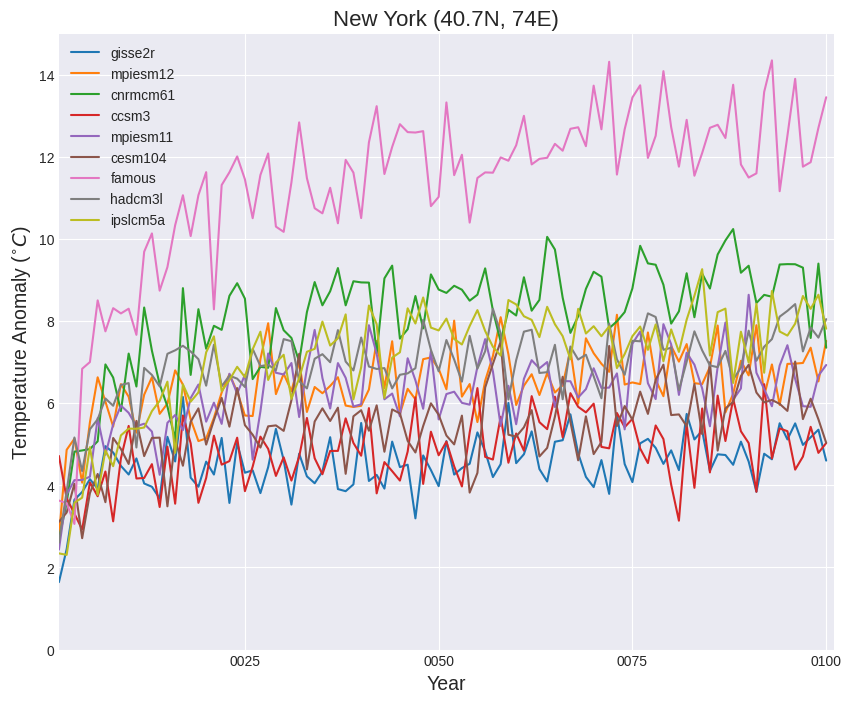

In [560]:
fig, ax = plot_single_point_all_models(abrupt4x_anom_ds, LocationsLatLon.NEW_YORK, length=100, ylim=(0, 15), 
                            ylabel=r'Temperature Anomaly ($^{\circ}C$)', xlabel='Year')

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'07_single_location_{LocationsLatLon.NEW_YORK.name}.png'),
           bbox_inches='tight')

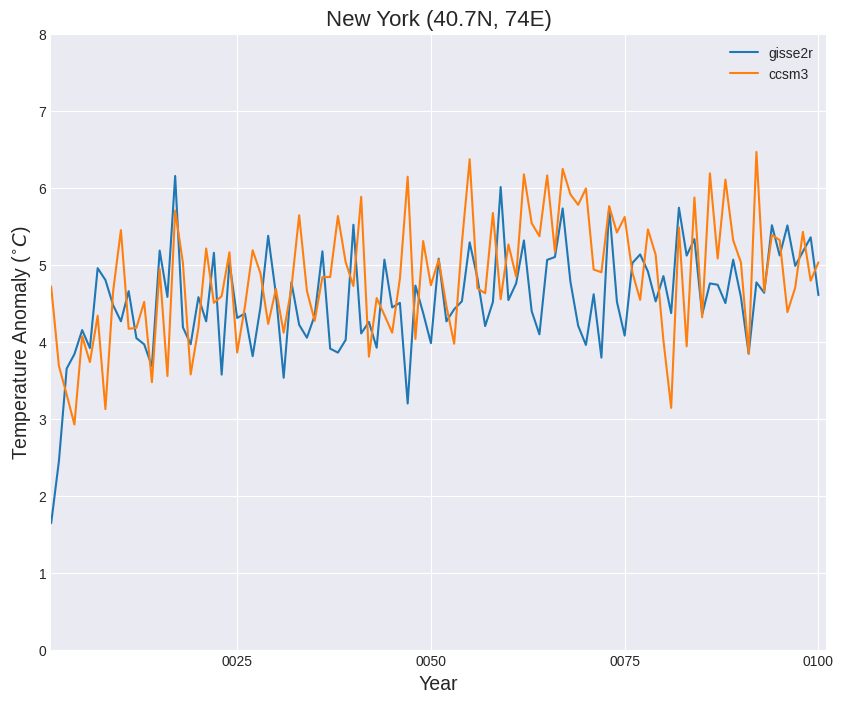

In [561]:
model_subset = ['gisse2r', 'ccsm3']
fig, ax = plot_single_point_all_models(abrupt4x_anom_ds[model_subset], 
                                       LocationsLatLon.NEW_YORK, length=100, ylim=(0, 8), 
                            ylabel=r'Temperature Anomaly ($^{\circ}C$)', xlabel='Year')

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'07_single_location_{LocationsLatLon.NEW_YORK.name}_{model_subset}.png'),
           bbox_inches='tight')

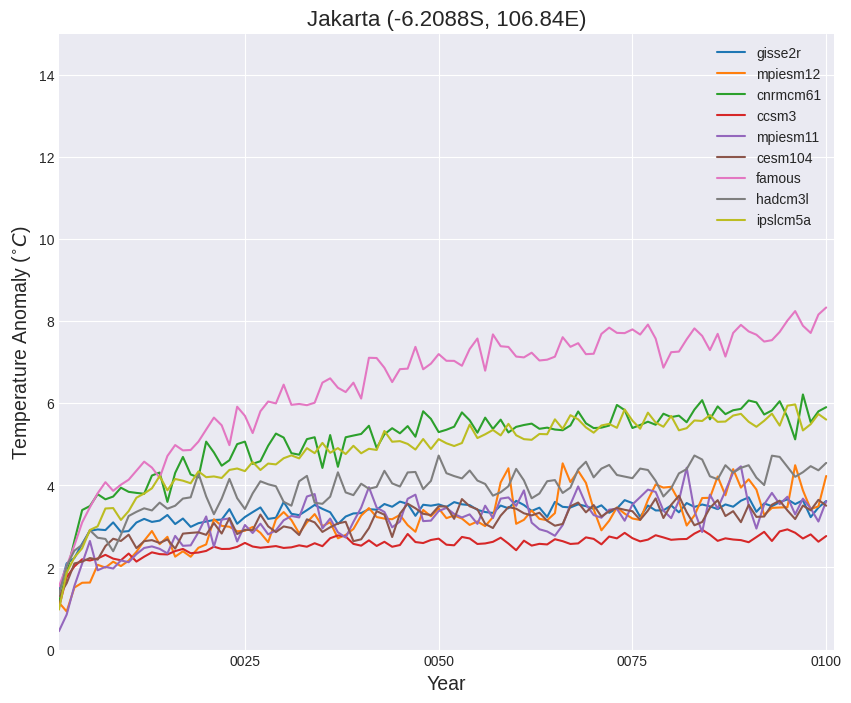

In [562]:
fig, ax = plot_single_point_all_models(abrupt4x_anom_ds, LocationsLatLon.JAKARTA, length=100, ylim=(0,15), 
                            ylabel=r'Temperature Anomaly ($^{\circ}C$)', xlabel='Year')


fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'07_single_location_{LocationsLatLon.JAKARTA.name}.png'),
           bbox_inches='tight')

In [105]:
models_of_interst = ['GISSE2R', 'IPSLCM5A']

In [106]:
model = models_of_interst[0]
model

'GISSE2R'

In [107]:
sn_da = sn_ds.sel(lat=lat, lon=lon, method='nearest').sel(model=model)['signal_to_noise']

abuprt_da = abrupt4x_anom_ds[model.lower()].sel(lat=lat, lon=lon, method='nearest')
abuprt_da = da.where(da.time.isin(sn_ds.time.values), drop =True)

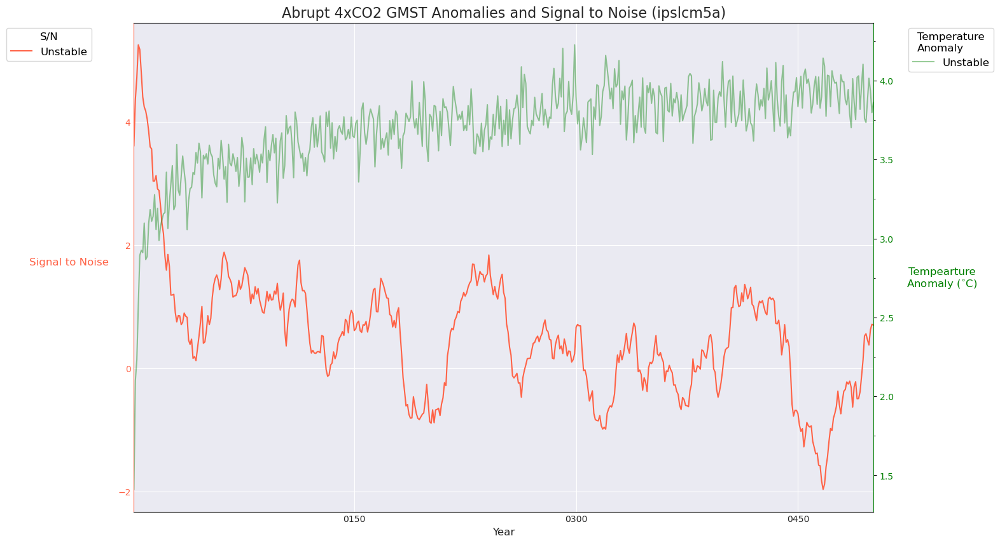

In [282]:
plt.style.use('seaborn-darkgrid')
reload(sn_plotting)

fig = plt.figure(figsize=  (15,10))
ax = fig.add_subplot(111)
sn_plotting.temperature_vs_sn_plot(ax,  sn_da, abuprt_da)
#                       temp_highlight = abrupt_stable_da, 
#                       sn_highlight = stable_da)

ax.set_xlim(sn_da.time.values[0], sn_da.time.values[500])
ax.set_title(f'Abrupt 4xCO2 GMST Anomalies and Signal to Noise ({model})', fontsize=16);

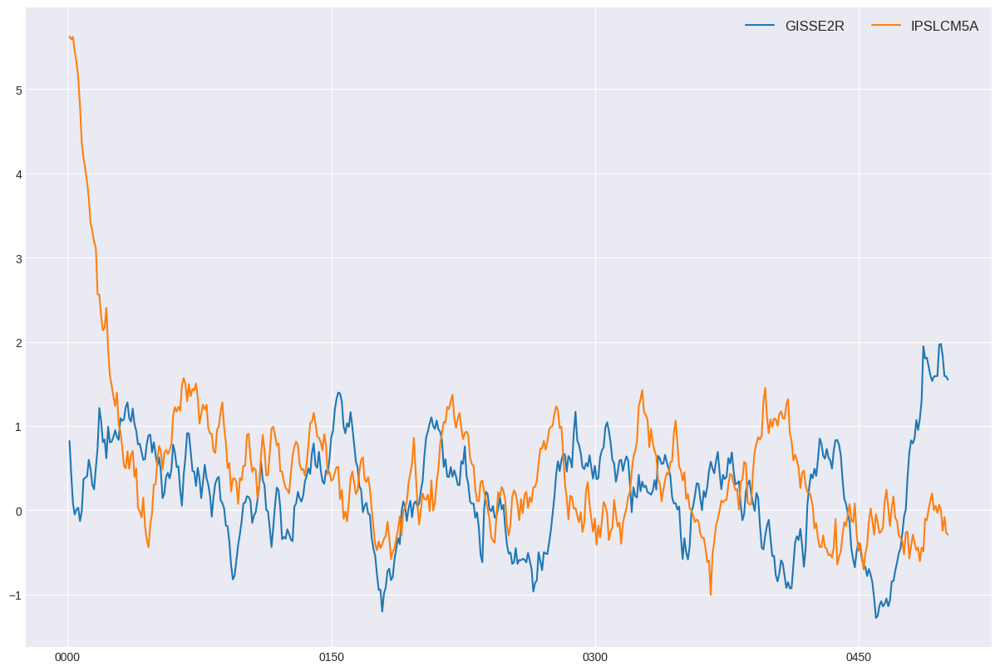

In [109]:
plt.style.use('seaborn-darkgrid')

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
for model in models_of_interst:
    da = sn_ds.sel(lat=lat, lon=lon, method='nearest').sel(model=model)['signal_to_noise']
    ax.plot(da.time.values, da.values, label=model)
    
leg = ax.legend(fontsize=12, ncol=3)

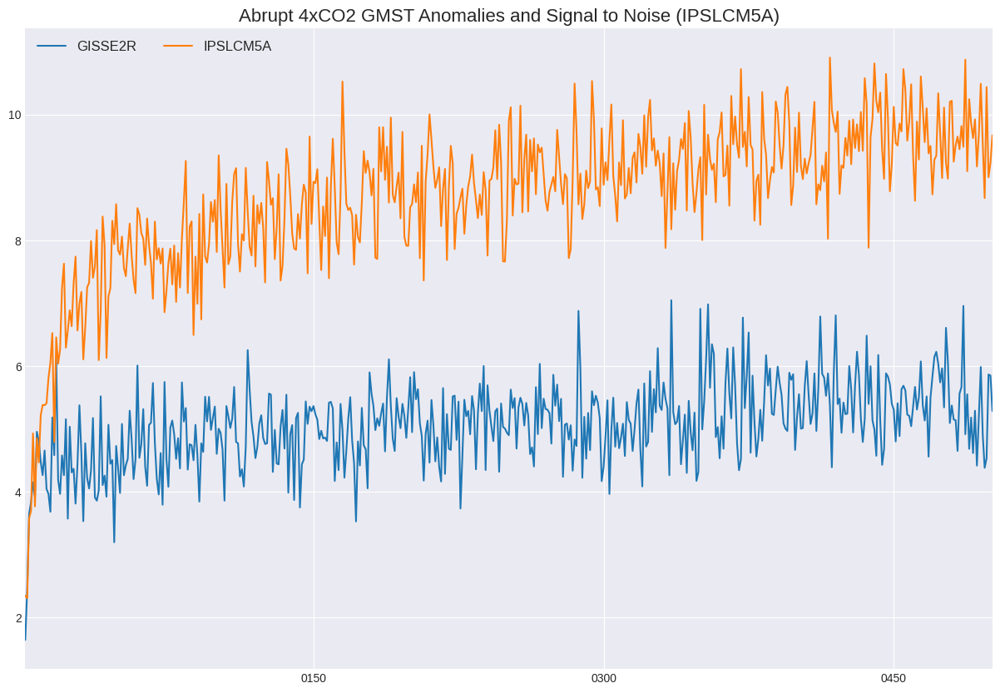

In [110]:
plt.style.use('seaborn-darkgrid')

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
for model in models_of_interst:
    da = abrupt4x_anom_ds[model.lower()].sel(lat=lat, lon=lon, method='nearest')
    da = da.where(da.time.isin(sn_ds.time.values), drop =True)
    ax.plot(da.time.values, da.values, label=model)
    
leg = ax.legend(fontsize=12, ncol=3)

ax.set_xlim(sn_da.time.values[0], sn_da.time.values[500])
ax.set_title(f'Abrupt 4xCO2 GMST Anomalies and Signal to Noise ({model})', fontsize=16);

40 74


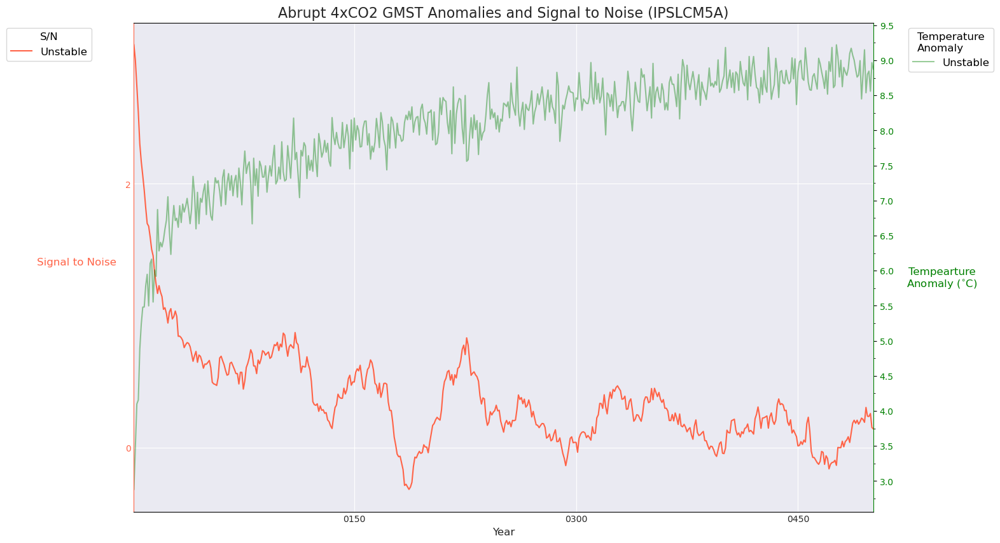

In [111]:

lat,lon = LocationsLatLon.NY.value
print(lat, lon)

sn_mean_da = sn_ds.sel(lat=lat, lon=lon, method='nearest').mean(dim='model')['signal_to_noise']

abuprt_mean_da = (abrupt4x_anom_ds
                  .sel(lat=lat, lon=lon, method='nearest')
                  .to_array(dim='model')
                  .mean(dim='model')
                 )
abuprt_mean_da = abuprt_mean_da.where(abuprt_mean_da.time.isin(sn_ds.time.values), drop =True)

plt.style.use('seaborn-darkgrid')
reload(sn_plotting)

fig = plt.figure(figsize=  (15,10))
ax = fig.add_subplot(111)
sn_plotting.temperature_vs_sn_plot(ax,  sn_mean_da, abuprt_mean_da)
#                       temp_highlight = abrupt_stable_da, 
#                       sn_highlight = stable_da)

ax.set_xlim(sn_da.time.values[0], sn_da.time.values[500])
ax.set_title(f'Abrupt 4xCO2 GMST Anomalies and Signal to Noise ({model})', fontsize=16);

-6.2088 106.84


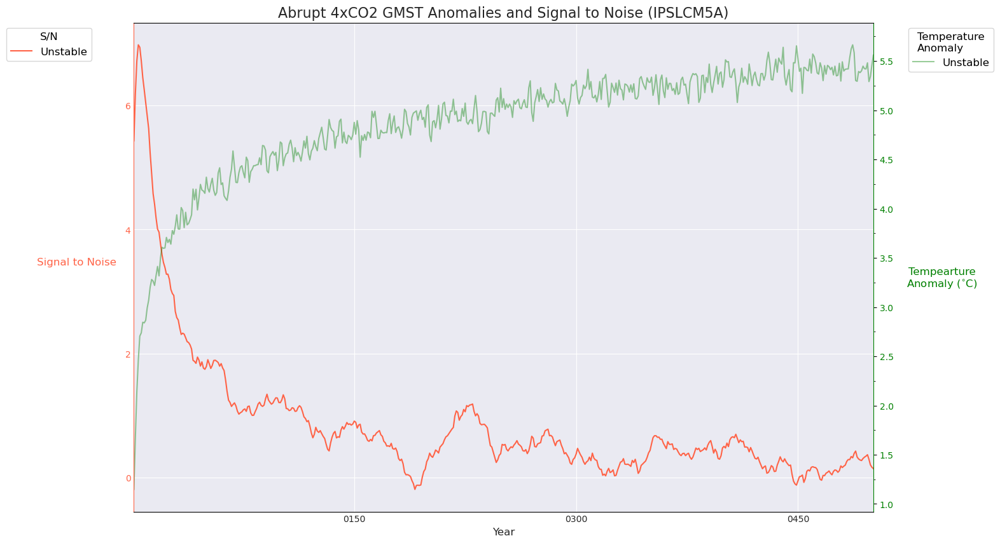

In [112]:

lat,lon = LocationsLatLon.JAKATA.value
print(lat, lon)

sn_mean_da = sn_ds.sel(lat=lat, lon=lon, method='nearest').mean(dim='model')['signal_to_noise']

abuprt_mean_da = (abrupt4x_anom_ds
                  .sel(lat=lat, lon=lon, method='nearest')
                  .to_array(dim='model')
                  .mean(dim='model')
                 )
abuprt_mean_da = abuprt_mean_da.where(abuprt_mean_da.time.isin(sn_ds.time.values), drop =True)

plt.style.use('seaborn-darkgrid')
reload(sn_plotting)

fig = plt.figure(figsize=  (15,10))
ax = fig.add_subplot(111)
sn_plotting.temperature_vs_sn_plot(ax,  sn_mean_da, abuprt_mean_da)
#                       temp_highlight = abrupt_stable_da, 
#                       sn_highlight = stable_da)

ax.set_xlim(sn_da.time.values[0], sn_da.time.values[500])
ax.set_title(f'Abrupt 4xCO2 GMST Anomalies and Signal to Noise ({model})', fontsize=16);

### Single Points

In [113]:
abuprt_anom_ds_2 = xr.concat([abrupt4x_anom_ds[model] for model in abrupt4x_anom_ds.data_vars],
          pd.Index([model.upper() for model in abrupt4x_anom_ds.data_vars], name='model'))
abuprt_anom_ds_2 = abuprt_anom_ds_2.where(abuprt_anom_ds_2.time.isin(stable_ds.time.values), drop=True)
abuprt_anom_ds_2

,Array,Chunk
Bytes,356.67 MiB,648.00 kiB
Shape,"(9, 501, 72, 144)","(1, 8, 72, 144)"
Count,27091 Tasks,567 Chunks
Type,float64,numpy.ndarray


In [114]:
model = 'GISSE2R'

lat,lon = LocationsLatLon.JAKATA.value
print(lat, lon)

sn_da = sn_ds['signal_to_noise'].sel(lat=lat, lon=lon, method='nearest').sel(model=model)
stable_da = stable_ds['signal_to_noise'].sel(lat=lat, lon=lon, method='nearest').sel(model=model)
abuprt_da = abuprt_anom_ds_2.sel(lat=lat, lon=lon, method='nearest').sel(model=model)
abrupt_stable_da = abuprt_da.where(np.isfinite(stable_da))


-6.2088 106.84


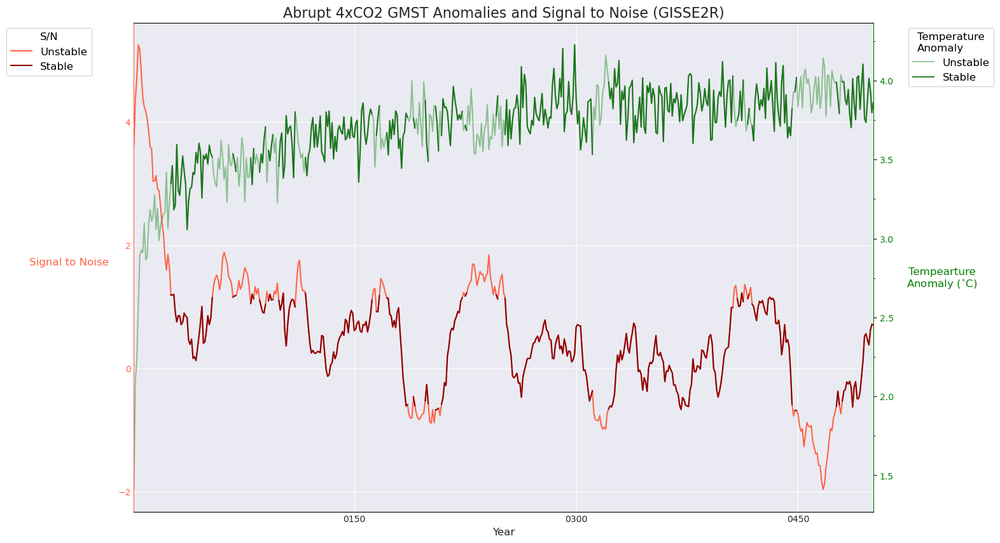

In [115]:
plt.style.use('seaborn-darkgrid')
reload(sn_plotting)

fig = plt.figure(figsize=  (15,10))
ax = fig.add_subplot(111)
sn_plotting.temperature_vs_sn_plot(ax,  sn_da, abuprt_da,
                      temp_highlight = abrupt_stable_da, 
                      sn_highlight = stable_da)

ax.set_xlim(sn_da.time.values[0], sn_da.time.values[500])
ax.set_title(f'Abrupt 4xCO2 GMST Anomalies and Signal to Noise ({model})', fontsize=16);

# fig.savefig(f'{IMG_DIR}/02_{model}_global_sn_temp_anomaly_t500.png', bbox_inches='tight', dpi=200)

# 100 Year Windows


## Calculation

In [148]:
period_list = (utils.create_period_list(step = 25, end = 2, start = 0) +
               utils.create_period_list(step = 50, end = 9, start = 1)) 
period_list

[(0, 24),
 (25, 49),
 (50, 99),
 (100, 149),
 (150, 199),
 (200, 249),
 (250, 299),
 (300, 349),
 (350, 399),
 (400, 449)]

In [261]:
# Get the percent of points stable in each period.

xr_dict = {}
for period in period_list:
    length = period[1] - period[0] + 1
    print(f'{period} - {length} years')
    name = str(period).replace('(','').replace(')','').replace(', ', '_')
    percent_stable = stable_ds['signal_to_noise'].isel(time=slice(*period)).count(dim='time') * 100/length
    percent_stable.name = 'percent'
    xr_dict[name] = percent_stable
    
percent_ds = xr.concat(list(xr_dict.values()), pd.Index(list(xr_dict.keys()), name='period')).to_dataset()
percent_ds

(0, 24) - 25 years
(25, 49) - 25 years
(50, 99) - 50 years
(100, 149) - 50 years
(150, 199) - 50 years
(200, 249) - 50 years
(250, 299) - 50 years
(300, 349) - 50 years
(350, 399) - 50 years
(400, 449) - 50 years


<xarray.Dataset>
Dimensions:  (lon: 144, lat: 72, model: 9, period: 10)
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * model    (model) object 'IPSLCM5A' 'CNRMCM61' ... 'MPIESM11' 'CESM104'
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    percent  (period, model, lat, lon) float64 24.0 24.0 24.0 ... 88.0 88.0 88.0

In [201]:
# The mean percent stable
percent_mean_da = percent_ds['percent'].mean(dim='model')
percent_mean_da.name = 'mean'

# The uncertainty in perent stable
percent_ucnertainty_da = (
    percent_ds['percent'].max(dim='model') - percent_ds['percent'].min(dim='model'))
percent_ucnertainty_da.name = 'uncertainty'

# Merge
percent_mean_ds = xr.merge([percent_mean_da, percent_ucnertainty_da])
percent_mean_ds

<xarray.Dataset>
Dimensions:      (lon: 144, lat: 72, period: 10)
Coordinates:
  * lon          (lon) float64 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
  * lat          (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period       (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    mean         (period, lat, lon) float64 35.56 35.56 36.0 ... 95.56 95.56
    uncertainty  (period, lat, lon) float64 96.0 96.0 96.0 ... 10.0 10.0 10.0

## Plotting

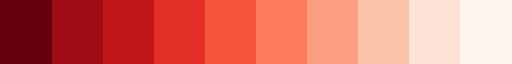

In [122]:
cmap = plt.cm.get_cmap('Reds_r', 10)
cmap

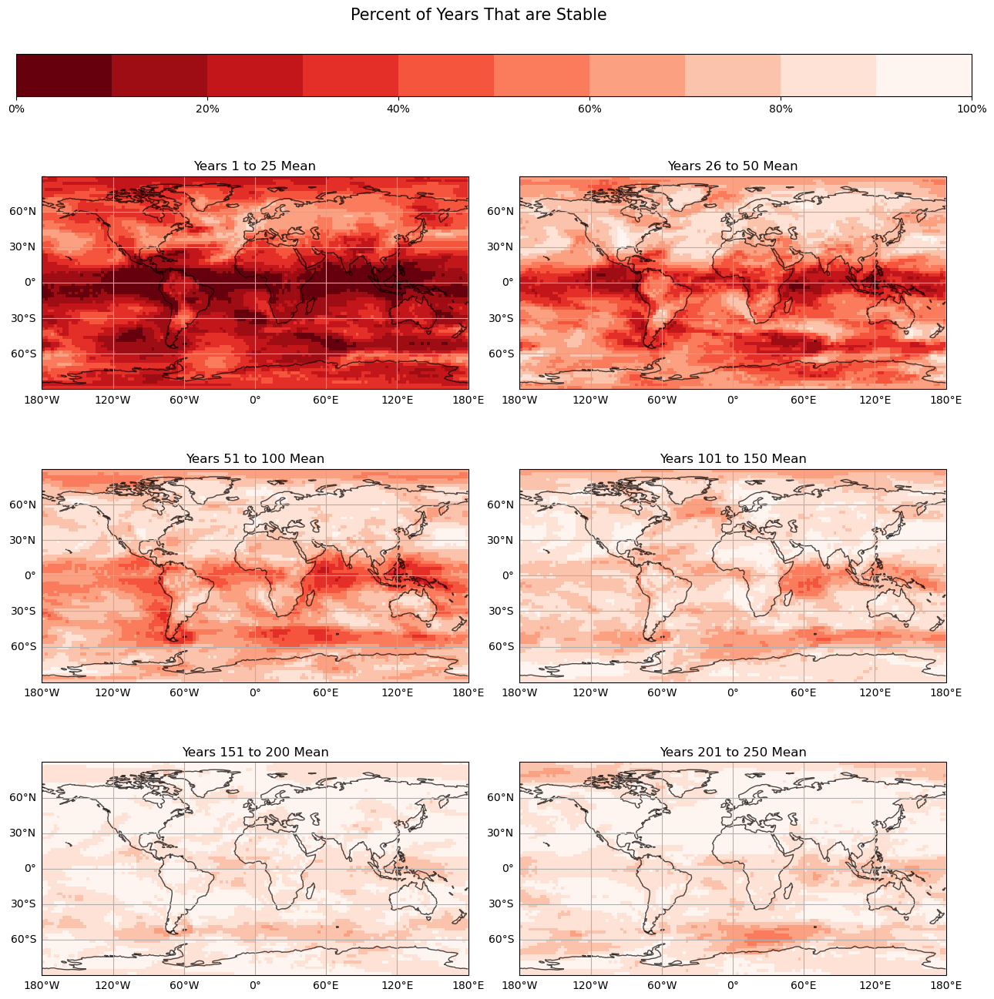

In [259]:
periods = percent_mean_ds.period.values[:6]

fig, gs, cbar = sn_plotting.plot_all_period_maps(percent_mean_ds['mean'].to_dataset(), periods,
                                       suptitle = 'Percent of Years That are Stable', cmap=cmap, 
                                      col_increase = 2)
# fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, '07_percent_years_stable_25_and_100_year.png'),
#            bbox_inches='tight', dpi=250)


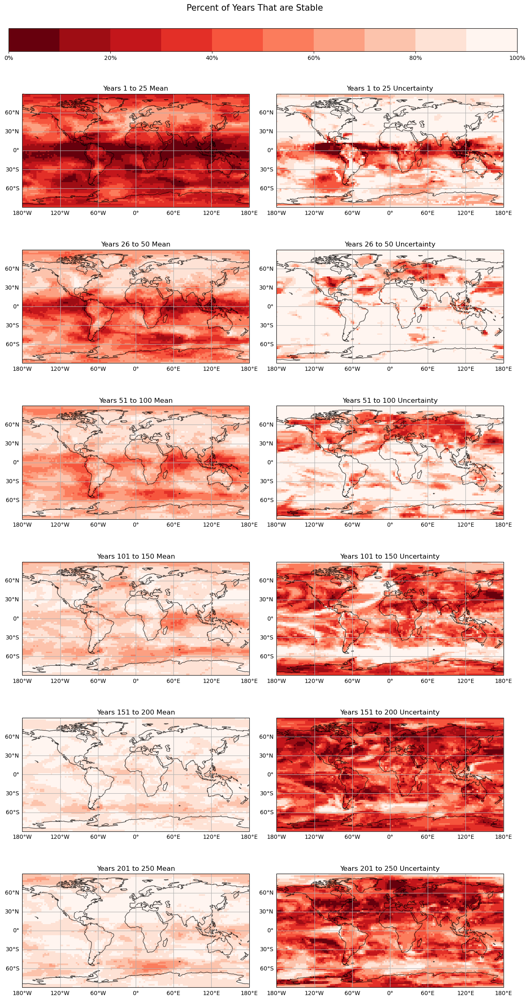

In [260]:
periods = percent_mean_ds.period.values[:6]

fig, gs, cbar =  sn_plotting.plot_all_period_maps(percent_mean_ds, periods,
                                       suptitle = 'Percent of Years That are Stable', cmap=cmap)

# fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, 
#                          '07_percent_years_stable_25_and_100_year_mean_and_uncertainty.png'),
#            bbox_inches='tight', dpi=250)

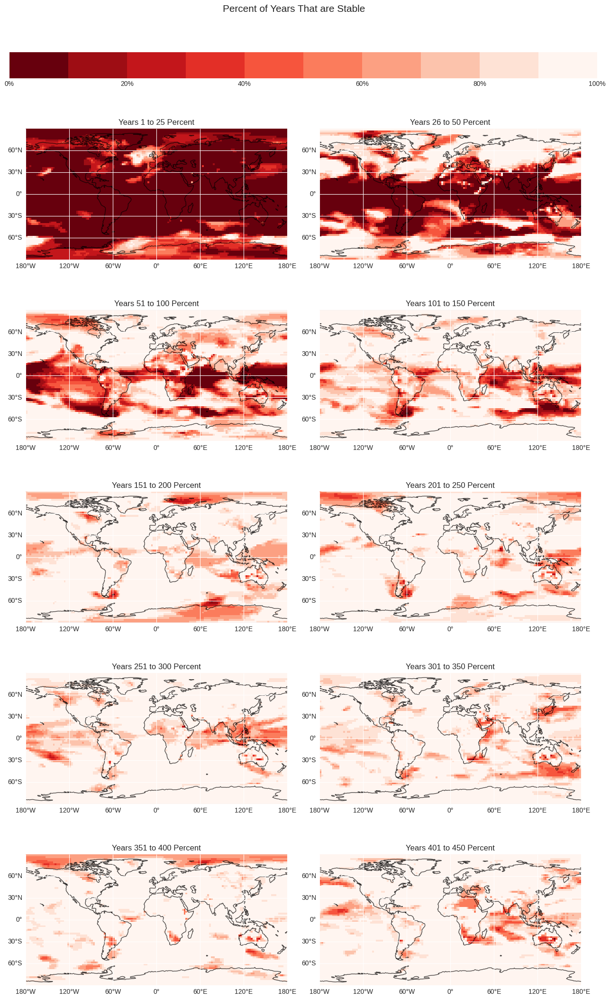

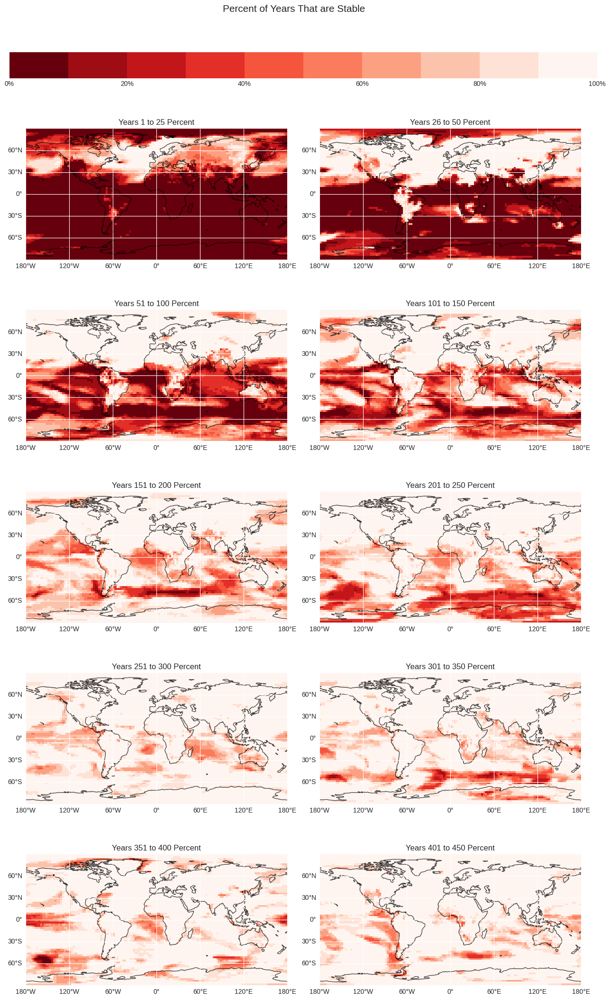

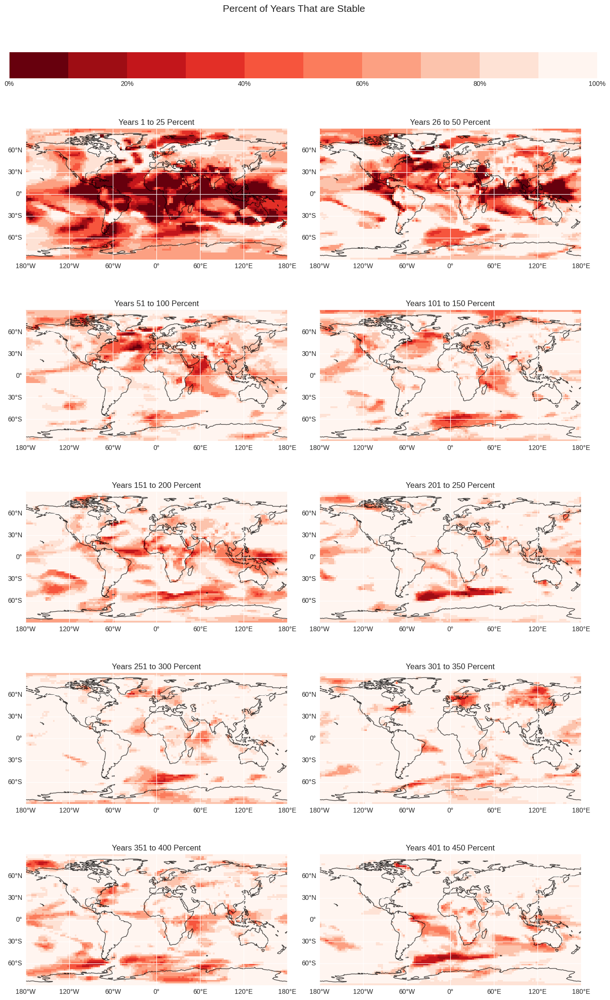

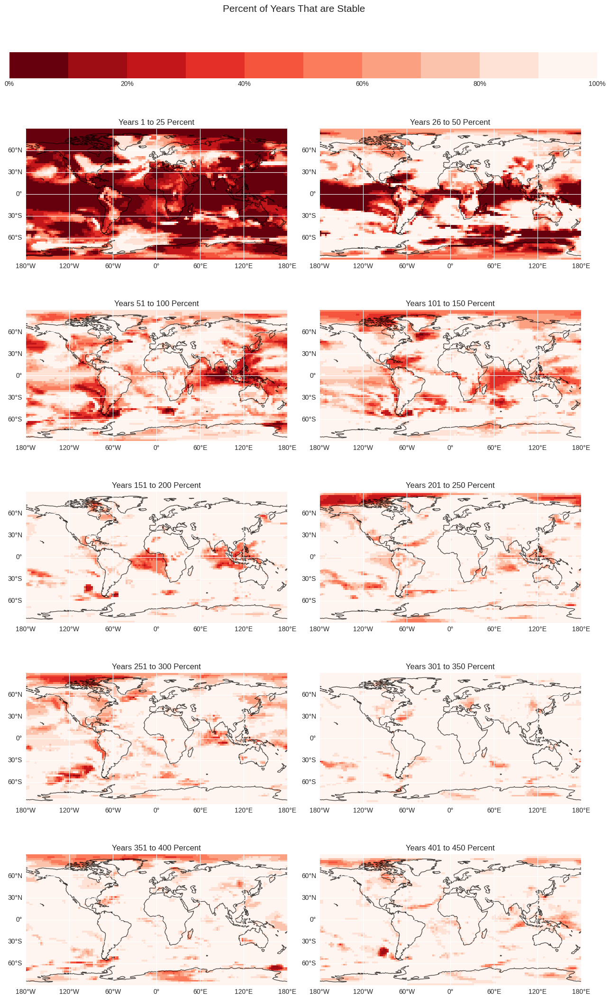

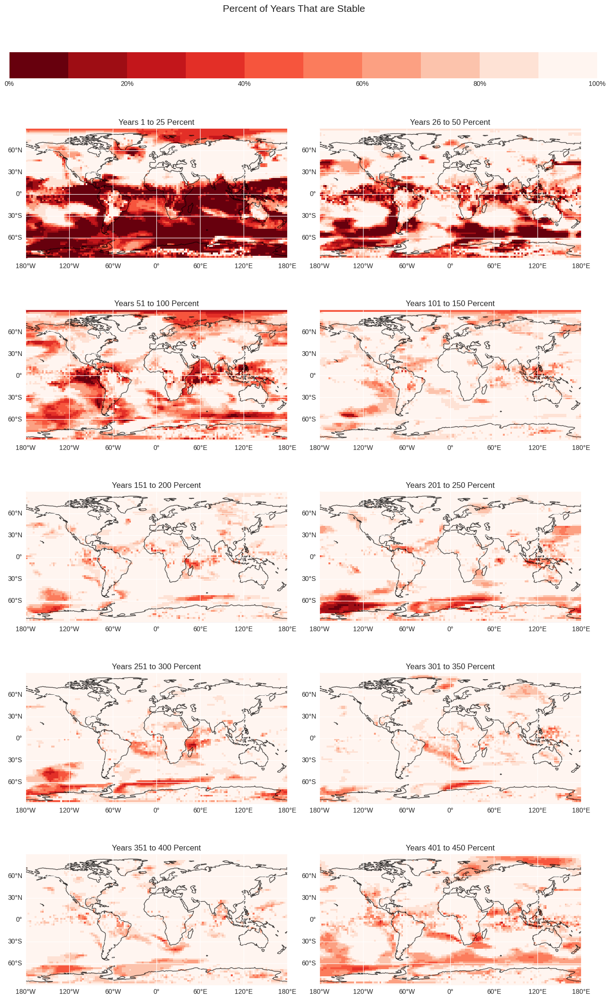

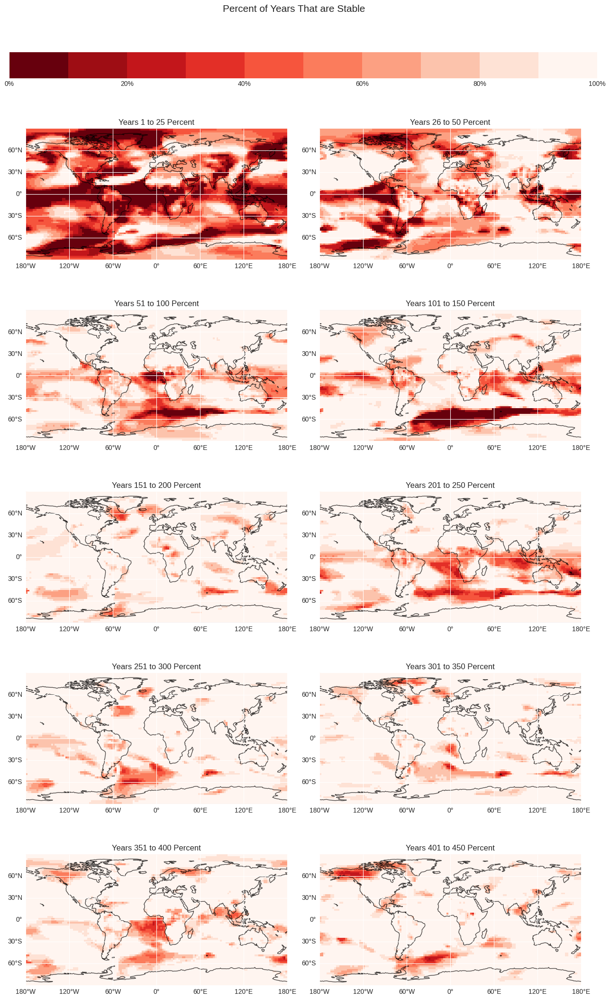

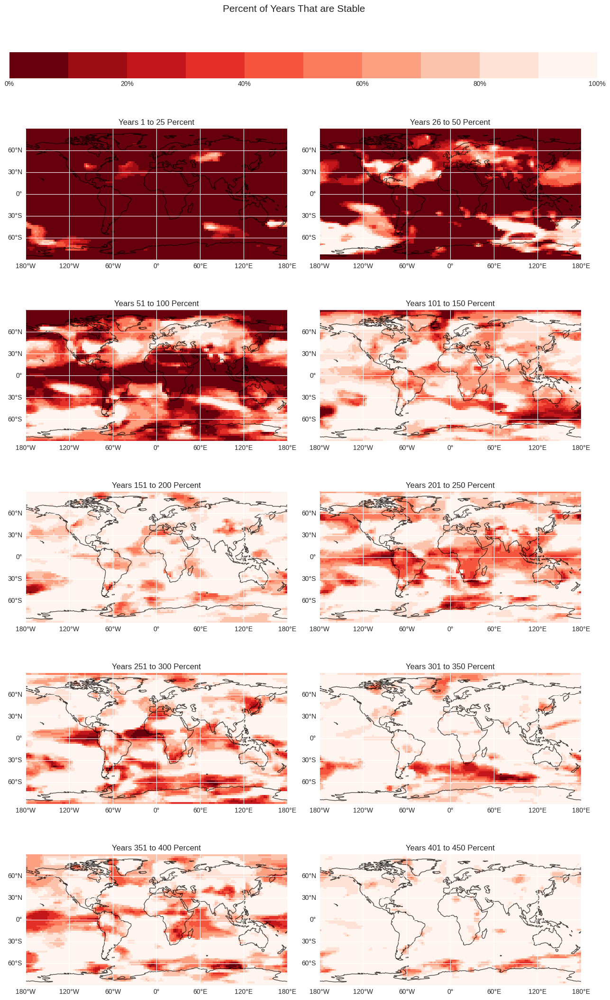

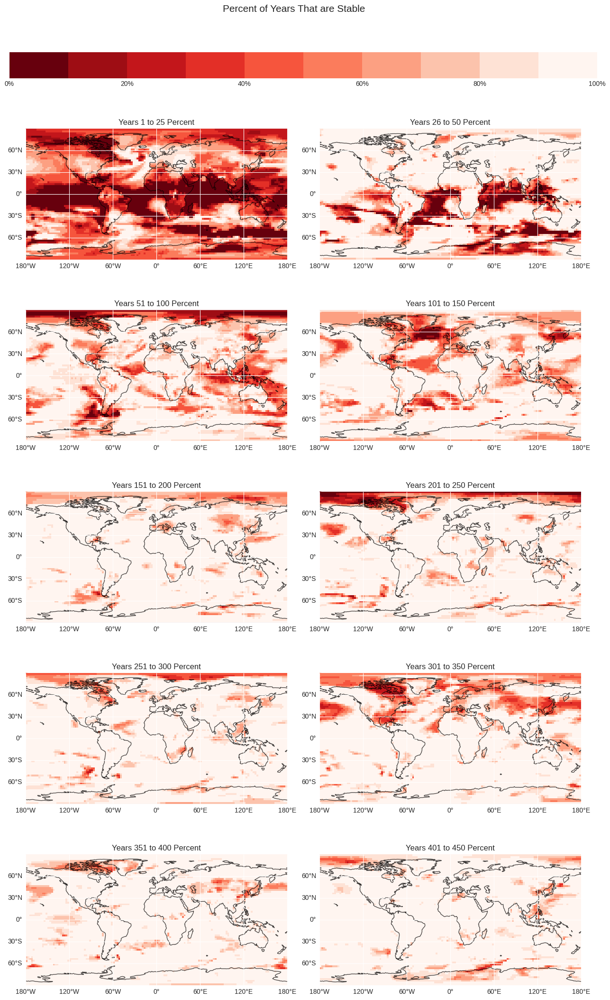

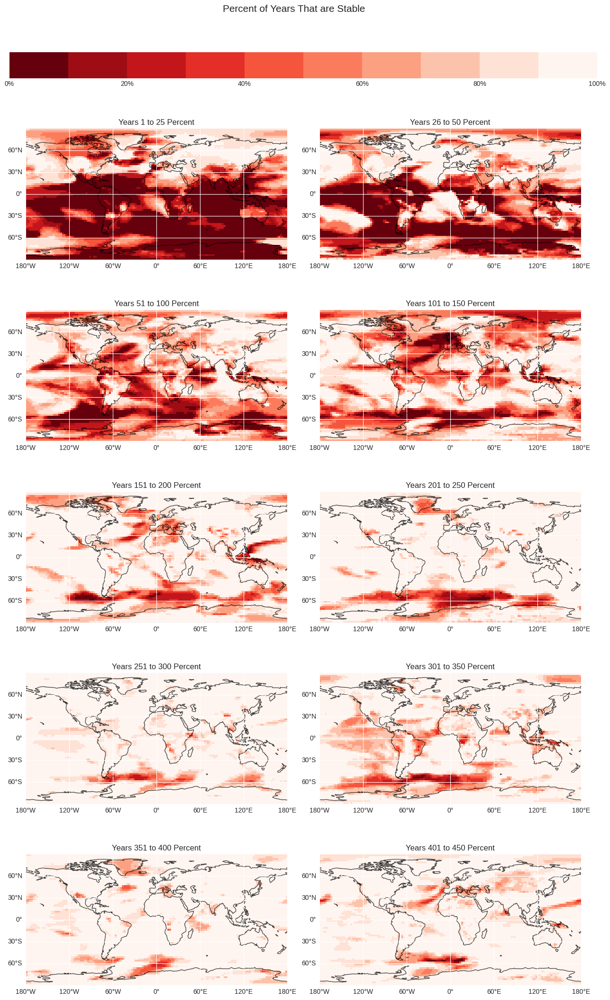

In [437]:
periods = percent_ds.period.values
models = percent_ds.model.values

for model in models:
    fig, gs, cbar = sn_plotting.plot_all_period_maps(percent_ds.sel(model=model), periods,
                                           suptitle = 'Percent of Years That are Stable', cmap=cmap, 
                                          col_increase = 2)
    fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, 
                             f'07_percent_years_stable_25_and_100_year_{model}.png'),
               bbox_inches='tight', dpi=250)

/local/w40/ab2313/tmp/ipykernel_1149852/1440621470.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(pcolor, cax=cax, orientation='horizontal')


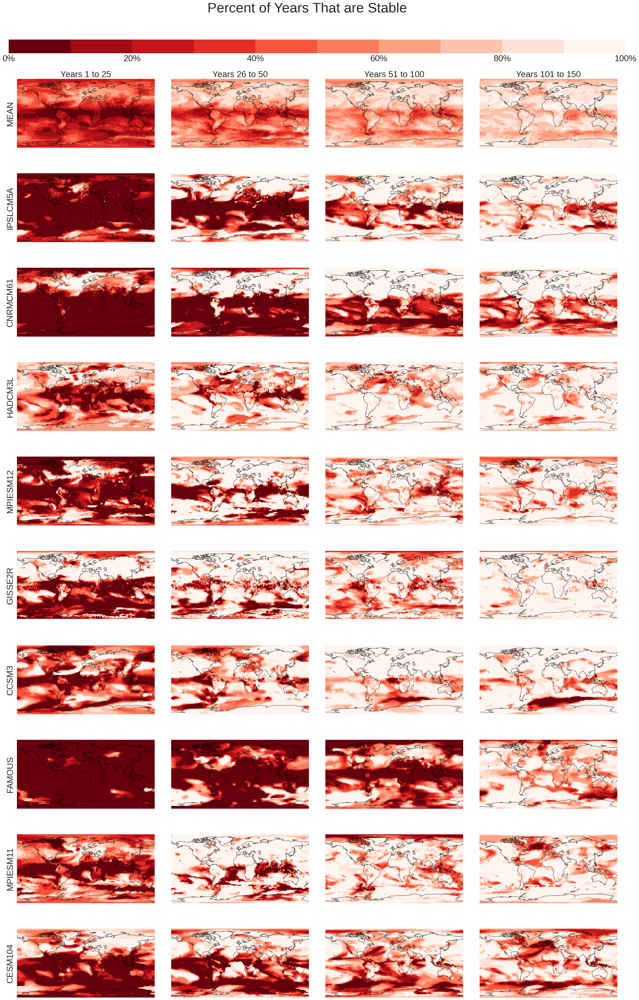

In [430]:
periods = percent_ds.period.values[:4]
models = percent_ds.model.values
models = np.insert(models, 0, 'mean')

ncols = len(periods)
nrows = len(models)
fig = plt.figure(figsize = (8 * ncols, 5 * nrows))
fig.suptitle('Percent of Years That are Stable', y=0.91, fontsize=40)

gs = gridspec.GridSpec(nrows + 1, ncols, height_ratios = [.2] + [1] * nrows, hspace=0.4, wspace=0)

for row_num, model in enumerate(models, 1):
    for col_num, period in enumerate(periods):
        ax = fig.add_subplot(gs[row_num, col_num], projection=ccrs.PlateCarree())
        
        if model == 'mean':
            da = percent_mean_ds['mean']
        else:
            da = percent_ds['percent'].sel(model=model)

        pcolor = da.sel(period=period).plot(
            ax=ax, vmin=0, vmax=100, cmap=cmap, extend='neither', add_colorbar=False)
        ax.coastlines(alpha=0.7)

        if row_num == 1:
            ax.set_title(convert_period_string(period), fontsize=25);
        else:
            ax.set_title('')
        
        if col_num == 0:
            ax.annotate(model.upper(), size=25, xy = (-.05, 0.5), clip_on=True, xycoords= 'axes fraction',
                       rotation=90, ha='center', va='center')
        
        plot_num += 1
    
cbar = format_colorbar(gs, pcolor, labelsize=25)  

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         '07_percent_years_stable_25_and_100_year_50_window_all_models.png'),
           bbox_inches='tight')

# Pattern Correlation

In [128]:
percent_ds

<xarray.Dataset>
Dimensions:  (lon: 144, lat: 72, model: 9, period: 10)
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * model    (model) object 'IPSLCM5A' 'CNRMCM61' ... 'MPIESM11' 'CESM104'
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    percent  (period, model, lat, lon) float64 24.0 24.0 24.0 ... 88.0 88.0 88.0

In [129]:
percent_mean_ds

<xarray.DataArray 'percent' (period: 10, lat: 72, lon: 144)>
array([[[35.55555556, 35.55555556, 36.        , ..., 35.55555556,
         35.55555556, 35.11111111],
        [35.11111111, 34.66666667, 35.11111111, ..., 33.77777778,
         35.55555556, 34.22222222],
        [38.22222222, 37.77777778, 40.44444444, ..., 38.66666667,
         39.55555556, 38.22222222],
        ...,
        [26.22222222, 26.66666667, 28.        , ..., 25.33333333,
         25.77777778, 25.77777778],
        [24.88888889, 25.33333333, 25.33333333, ..., 22.66666667,
         23.11111111, 24.44444444],
        [26.66666667, 26.66666667, 26.66666667, ..., 26.66666667,
         26.66666667, 26.66666667]],

       [[66.22222222, 65.77777778, 65.77777778, ..., 66.66666667,
         67.11111111, 67.11111111],
        [60.44444444, 60.44444444, 60.        , ..., 61.77777778,
         60.        , 61.77777778],
        [63.11111111, 60.44444444, 59.55555556, ..., 62.66666667,
         62.22222222, 65.33333333],
...
        [92.44444444, 92.        , 91.33333333, ..., 90.44444444,
         92.        , 92.22222222],
        [87.77777778, 87.77777778, 87.77777778, ..., 87.55555556,
         87.77777778, 87.77777778],
        [84.44444444, 84.66666667, 84.88888889, ..., 84.22222222,
         84.22222222, 84.22222222]],

       [[94.22222222, 94.22222222, 94.22222222, ..., 94.        ,
         94.44444444, 94.44444444],
        [95.33333333, 95.33333333, 95.33333333, ..., 94.22222222,
         93.11111111, 95.33333333],
        [94.        , 94.22222222, 94.88888889, ..., 95.11111111,
         95.11111111, 94.66666667],
        ...,
        [97.55555556, 97.55555556, 97.55555556, ..., 96.88888889,
         96.88888889, 96.88888889],
        [96.66666667, 96.22222222, 96.        , ..., 96.        ,
         96.22222222, 96.66666667],
        [95.55555556, 95.55555556, 95.55555556, ..., 95.55555556,
         95.55555556, 95.55555556]]])
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'

In [130]:
model

'CESM104'

In [131]:
percent_ds

<xarray.Dataset>
Dimensions:  (lon: 144, lat: 72, model: 9, period: 10)
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * model    (model) object 'IPSLCM5A' 'CNRMCM61' ... 'MPIESM11' 'CESM104'
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    percent  (period, model, lat, lon) float64 24.0 24.0 24.0 ... 88.0 88.0 88.0

In [132]:

models = percent_ds.model.values
periods = percent_ds.period.values

pattern_corr_dict = {}
for period in periods:
#     flat_mean = percent_mean_ds.sel(period=period).values.flatten()
    period_dict = {}
    for model in models:
        
        percent_drop_model_ds = percent_ds.where(percent_ds.model.isin(models[models != model]), drop=True)
        percent_drop_model_ds = percent_drop_model_ds['percent'].sel(period = period)
        percent_drop_model_mean_np = percent_drop_model_ds.mean(dim='model').values.flatten()
        
        percent_da = percent_ds['percent'].sel(model=model, period=period)
        percent_np = percent_da.values.flatten()

        pattern_corr = spearmanr(percent_np, percent_drop_model_mean_np)

        period_dict[model] = pattern_corr[0]
    pattern_corr_dict[period] = period_dict

In [133]:
pattern_corr_df = pd.DataFrame(pattern_corr_dict)
pattern_corr_df

,0_24,25_49,50_99,100_149,150_199,200_249,250_299,300_349,350_399,400_449
IPSLCM5A,0.357160,0.583652,0.407047,0.155629,0.107268,0.221087,-0.001753,0.028064,0.143750,0.034933
CNRMCM61,0.624505,0.628574,0.406271,0.063841,0.143045,0.195973,0.189047,0.002872,0.196054,0.138280
HadCM3L,0.480382,0.078263,-0.073833,0.156754,0.197782,0.153336,0.162843,0.118573,0.195899,0.133144
MPIESM12,0.402736,0.520399,0.312985,0.253550,0.111051,0.184507,0.101143,0.009597,0.179888,0.089024
GISSE2R,0.482096,0.435225,0.260776,0.063040,0.059983,0.075878,0.033965,-0.075036,0.028220,0.066129
CCSM3,0.332711,0.183992,0.407280,0.169622,0.030572,0.262683,0.041797,0.048262,0.131593,0.070813
FAMOUS,0.110466,0.149901,0.253918,0.071493,0.016339,0.027377,0.183069,0.104115,0.116910,-0.021399
MPIESM11,0.524311,0.492653,0.210859,0.009693,-0.076129,0.020757,0.052264,-0.230590,-0.042382,-0.038819
CESM104,0.534120,0.517067,0.224631,0.242013,0.172853,0.103043,0.240169,-0.067032,0.178749,-0.017466


In [134]:
xticklabels = [convert_period_string(period) for period in percent_mean_ds.period.values]
xticklabels = [' '.join(x.split(' ')[1:]) for x in xticklabels] # Getting rid of "Years" string start
xticklabels

['1 to 25',
 '26 to 50',
 '51 to 100',
 '101 to 150',
 '151 to 200',
 '201 to 250',
 '251 to 300',
 '301 to 350',
 '351 to 400',
 '401 to 450']

Text(95.72222222222221, 0.5, 'Model')

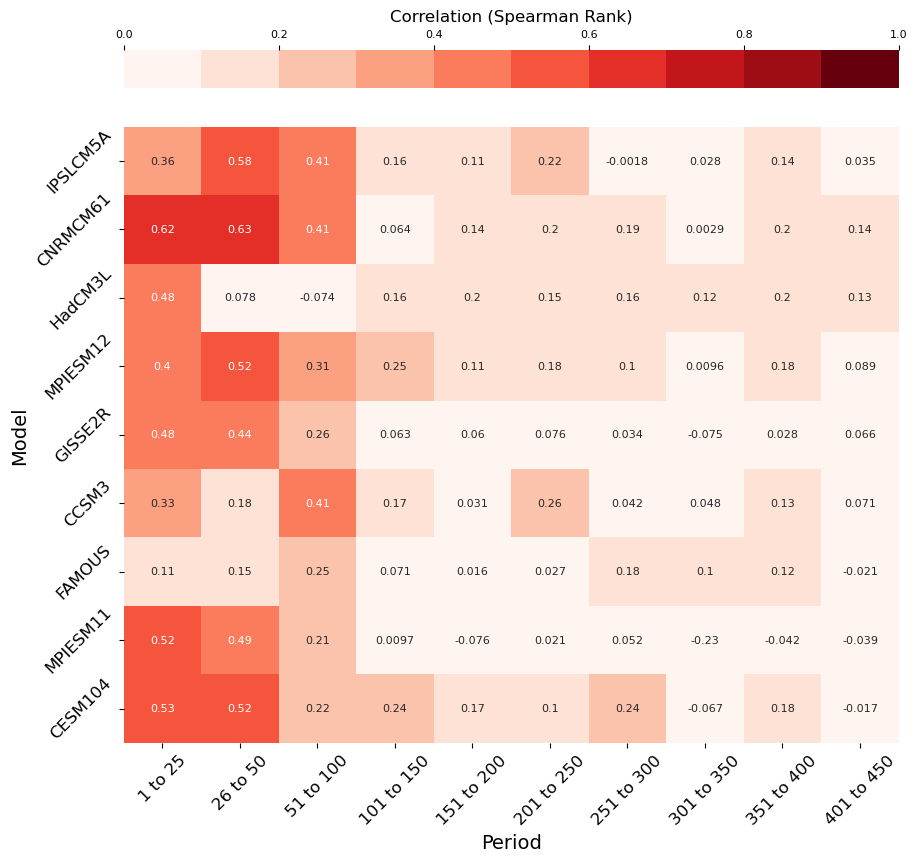

In [135]:
fig = plt.figure(figsize=(10,10))
ax = sns.heatmap(pattern_corr_df, cmap=cmap.reversed(), vmin=0, vmax=1, annot=True, 
           cbar_kws=dict(location='top'), xticklabels = xticklabels,
                annot_kws = dict(fontsize=8))


ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=12, rotation=45)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=12, rotation=45)


cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=8)
cbar.ax.set_title('Correlation (Spearman Rank)', fontsize=12)

plt.xlabel("Period", size=14)
plt.ylabel("Model", size=14)

# fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, '07_percent_stable_heat_map.png'), 
#            bbox_inches='tight', dpi=200)